# **Anime Sketch Colorization Pair**






**Problem statement:**

For a given sketch generate a Color Image

**Data Overview**

Taken data from Danbooru Sketch Pair 128x on kaggle https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128x

We are given two Folders:-

- Skecth - Having  sketch images

- Color - Having corresponding Colored images.

We will pick some images from these folders to train the model and then test it on some pairs not seen by the model.


**Real-world/Business objectives and constraints.**

*   No low-latency requirement.
*   Images generated should have colors same as original image and shouldn't be blurred.


**Performance metric for supervised learning:**


*   Mean Absolute Error/  L1 Loss (L1 dist per pixel)
*   Binary Cross Entropy loss to predict image generated is real or fake(for GAN models)
 




**Solution :-**

We will try to generate Color Images using below models -
 - Unet model to minimize Mean Absolute error at Pixel Level.
 - GAN model to minimize binary cross-entropy loss for real vs fake images(model generated image) and L1 loss at pixel level.

**1. Download the Images.**

In [0]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/80.0.3987.106 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-data-sets/198718/800362/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1583004616&Signature=DAFIsZ7HWxQaSDFnDuQ%2B1B%2FIJKOxbXrld4LxSdkraBV%2B%2F5DvKL7m2EYyqFe50e6PsFZ1TEXpbgQcEV3c%2B86ReWVKrVJ7jv0nC9lqQabu12z6cjYY3qrtpy0KexiN3qHitnwwCczKQz%2FjyEzyRtxc1cpST0rZpxmmiKCx1V7rH8fVn05Dndp3Z1KJyUGw0k%2B%2B0uam%2BA8jWZD3bGgBX%2BeshcSsVyx9UDPhC38WgtdC%2BzpWTuAQfx78F4o0ai8czYF46LW%2FrsCg1PWgJwDyO02lFBR%2FPw3plPwcWCXNTd3inTVVH24sR0CXmCLhUXTKd7Bwz90ja3Qp5LRAnYZEQrUIDw%3D%3D&response-content-disposition=attachment%3B+filename%3Ddanbooru-sketch-pair-128x.zip" -O "danbooru-sketch-pair-128x.zip" -c

--2020-02-26 19:30:45--  https://storage.googleapis.com/kaggle-data-sets/198718/800362/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1583004616&Signature=DAFIsZ7HWxQaSDFnDuQ%2B1B%2FIJKOxbXrld4LxSdkraBV%2B%2F5DvKL7m2EYyqFe50e6PsFZ1TEXpbgQcEV3c%2B86ReWVKrVJ7jv0nC9lqQabu12z6cjYY3qrtpy0KexiN3qHitnwwCczKQz%2FjyEzyRtxc1cpST0rZpxmmiKCx1V7rH8fVn05Dndp3Z1KJyUGw0k%2B%2B0uam%2BA8jWZD3bGgBX%2BeshcSsVyx9UDPhC38WgtdC%2BzpWTuAQfx78F4o0ai8czYF46LW%2FrsCg1PWgJwDyO02lFBR%2FPw3plPwcWCXNTd3inTVVH24sR0CXmCLhUXTKd7Bwz90ja3Qp5LRAnYZEQrUIDw%3D%3D&response-content-disposition=attachment%3B+filename%3Ddanbooru-sketch-pair-128x.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 2607:f8b0:400e:c09::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10424880981 (9.7G) [application/zip]
Saving to: ‘danbooru-sketch-pair-128x.zip’

danbooru-ske

In [0]:
#Extract Images from zip folder.
#Ref- https://stackoverflow.com/questions/3451111/unzipping-files-in-python
from zipfile import ZipFile
with ZipFile('danbooru-sketch-pair-128x.zip', 'r') as zf:
    zf.extractall('sketch-pair/')

**2. Import Required Libraries.**

In [4]:
#Import all the required libraries. 
import warnings #Suppress warning. 
warnings.filterwarnings("ignore")

from keras.layers import Activation, Dense, Dropout, Flatten, Input, Add, Conv2D, Conv2DTranspose, LeakyReLU #Keras Layers.
from keras.layers.normalization import BatchNormalization #Batch Normalization for keras layer.
from keras.models import Model #Keras Model
from keras.optimizers import Adam #Adam Optimizer.
from keras import losses #Keras Loss function.
import numpy as np #Numpy array handling.
import os #System variables.
import random #Library to generate random numbers
import cv2 #Image processing.
from google.colab.patches import cv2_imshow #library to show images in Colab
import matplotlib.pyplot as pyplot #Plotting graphs
from datetime import datetime #Using this library for timer.
import tensorflow as tf
from keras.callbacks import TensorBoard
from keras.regularizers import l2


Using TensorFlow backend.


**3. Load Data**

In [0]:
#Load Name of files.

img_name = [] #Array to store name of the image.

for i in  range(26): #Processing first 15 folders.
  folder=i.__str__().zfill(4) #Printing Folder number in 4 byte format.
  loc = 'sketch-pair/danbooru-sketch-pair-128x/color/sketch/' + folder + '/' #location of sketch images.
  for filename in os.listdir(loc):    #Process each image from the current folder.
    img_name.append(folder+'/'+filename)  #Store folder + filename.

In [6]:
print('Total number of images:',len(img_name))

Total number of images: 51437


In [0]:
#Generate List of Train, test and validation images.
img_tr  = img_name[0:10000]
img_val = img_name[10000:11500]
img_tst = img_name[11500:13000]

In [8]:
#Sample name of an image
img_tr[0]

'0000/2411000.png'

In [9]:
#Length of train, test and validation data.
print('Number of images in train data:',len(img_tr))
print('Number of images in validation data:',len(img_val))
print('Number of images in test data:',len(img_tst))

Number of images in train data: 10000
Number of images in validation data: 1500
Number of images in test data: 1500


In [0]:
#Initialize batch pointers.
train_batch_pointer = 0
val_batch_pointer = 0

**4. GAN Model to generate Color Images**

In [0]:
#Defining a Random Gaussian variable to initialize weight for Conv layers.
from keras.initializers import RandomNormal
init = RandomNormal(stddev=0.02)

In [0]:
#Generator Model with U-net architecture.
#For the Generator Architecture referred - https://github.com/kvfrans/deepcolor/blob/master/main.py.
#The Code above was in tensor-flow. So, changed that to a Keras model.

def build_generator():

    #Encoder Unit
    #Input Layer (128, 128, 3)
    encoder_input = Input(shape=(128, 128, 3,))
    #Layer-1 Output image of shape - 64 * 64 * 64
    encoder_output_1 = Conv2D(64, (5,5), padding='same',  strides=2, kernel_initializer=init)(encoder_input)
    #Leaky ReLUs allow a small, non-zero gradient when the unit is not active. 
    encoder_output_2 = LeakyReLU(alpha=0.2)(encoder_output_1)
    #Layer-2 Output image of shape - 32 * 32 * 128
    encoder_output_2 = Conv2D(128, (5,5),  padding='same', strides=2, kernel_initializer=init)(encoder_output_2)
    #Batch Normalization.
    encoder_output_2 = BatchNormalization(momentum=0.9)(encoder_output_2)
    #Layer-3 Output image of shape - 16 * 16 * 256
    encoder_output_3 = LeakyReLU(alpha=0.2)(encoder_output_2)
    encoder_output_3 = Conv2D(256, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_3)
    encoder_output_3 = BatchNormalization(momentum=0.9)(encoder_output_3)
    #Layer-4 Output image of shape - 8 * 8 * 512
    encoder_output_4 = LeakyReLU(alpha=0.2)(encoder_output_3)
    encoder_output_4 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_4)
    encoder_output_4 = BatchNormalization(momentum=0.9)(encoder_output_4)
    #Layer-5 Output image of shape - 4 * 4 * 512
    encoder_output_5 = LeakyReLU(alpha=0.2)(encoder_output_4)
    encoder_output_5 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_5)
    encoder_output_5 = BatchNormalization(momentum=0.9)(encoder_output_5)
    

    
    #Decoder Unit
    #Conv2DTranspose - The need for transposed convolutions generally arises from the desire to use a transformation going in the opposite 
    #direction of a normal convolution, i.e., from something that has the shape of the output of some convolution to 
    #something that has the shape of its input while maintaining a connectivity pattern that is compatible with said convolution.
    #Ref- https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose
    #Layer-6 Output image of shape - 8 * 8 * 512
    encoder_output_6 = Conv2DTranspose(512, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init )(encoder_output_5)
    encoder_output_6  = BatchNormalization(momentum=0.9)(encoder_output_6)
    #Concatenating output from previous layer with output from layer-4. Both are of same dimension.
    encoder_output_6 = Add()([encoder_output_6, encoder_output_4])
    #Layer-7 Output image of shape - 16 * 16 * 256
    encoder_output_7 = Conv2DTranspose(256, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_6)
    encoder_output_7  = BatchNormalization(momentum=0.9)(encoder_output_7)
    #Concatenating output from previous layer with output from layer-3. Both are of same dimension.
    encoder_output_7 = Add()([encoder_output_7, encoder_output_3])
    #Layer-8 Output image of shape - 32 * 32 * 128
    encoder_output_8 = Conv2DTranspose(128, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_7)
    encoder_output_8  = BatchNormalization(momentum=0.9)(encoder_output_8)
    #Concatenating output from previous layer with output from layer-2. Both are of same dimension.
    encoder_output_8 = Add()([encoder_output_8, encoder_output_2]) 
    #Layer-9 Output image of shape - 64 * 64 * 64
    encoder_output_9 = Conv2DTranspose(64, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_8)
    encoder_output_9  = BatchNormalization(momentum=0.9)(encoder_output_9)
    #Concatenating output from previous layer with output from layer-1. Both are of same dimension
    encoder_output_9 = Add()([encoder_output_9, encoder_output_1]) 
    #Layer-10 (Output Layer) Output image of shape - 128 * 128 * 3
    encoder_output = Conv2DTranspose(3, (5,5), padding='same', activation='tanh', strides=2, kernel_initializer=init, name="gen_output")(encoder_output_9)
    
    #Defining Model with input and Outputs.
    model = Model(encoder_input, encoder_output)
    #Return Model.
    return model

In [13]:
#Discriminator Model.
#For the Discriminator Architecture referred - https://github.com/kvfrans/deepcolor/blob/master/main.py.
#The Code above was in tensor-flow. So, changed that to a Keras model.

def build_discriminator():

    #Input Layer (128, 128, 3)
    encoder_input = Input(shape=(128, 128, 3,))
    #Layer-1 Output image of shape - 64 * 64 * 64
    encoder_output_1 = Conv2D(64, (5,5), padding='same',  strides=2, kernel_initializer=init)(encoder_input)
    #Leaky ReLUs allow a small, non-zero gradient when the unit is not active.
    encoder_output_2 = LeakyReLU(alpha=0.2)(encoder_output_1)
    #Layer-2 Output image of shape - 32 * 32 * 128
    encoder_output_2 = Conv2D(128, (5,5),  padding='same', strides=2, kernel_initializer=init)(encoder_output_2)
    encoder_output_2 = BatchNormalization(momentum=0.9)(encoder_output_2)
    #Layer-3 Output image of shape - 16 * 16 * 256
    encoder_output_3 = LeakyReLU(alpha=0.2)(encoder_output_2)
    encoder_output_3 = Conv2D(256, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_3)
    encoder_output_3 = BatchNormalization(momentum=0.9)(encoder_output_3)
    #Layer-4 Output image of shape - 8 * 8 * 512
    encoder_output_4 = LeakyReLU(alpha=0.2)(encoder_output_3)
    encoder_output_4 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_4)
    encoder_output_4 = BatchNormalization(momentum=0.9)(encoder_output_4)
    encoder_output_5 = LeakyReLU(alpha=0.2)(encoder_output_4)
    #Flatten Output to apply Dense layer.
    encoder_output_5 = Flatten()(encoder_output_5)
    #Activation unit with Sigmoid layer.
    encoder_output = Dense(units=1, activation='sigmoid', name="disc_output")(encoder_output_5)
    #Defining Model with input and Outputs.
    model = Model(encoder_input, encoder_output)   
    #Adam Optimizer.
    opt = Adam(lr=0.0002, beta_1=0.5) 
    #Compile the model. 
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    #Return Model.
    return model


#Call the Discriminator model.
d =build_discriminator()


#Print the Summary.
d.summary()















Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 64)        4864      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       204928    
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________

In [0]:
#Defining Loss function to calculate L1 loss at pixel level.
#Ref - https://towardsdatascience.com/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb

import tensorflow.keras.backend as K

def pixLevel_loss(y, g): #Arguments  - y (Real target images), g (Output Images from generator model)

  #Defining a Pixel level function that would be returned  

  def finalPLLoss(y_true, y_pred):
    return K.mean(K.abs( y - g ) )
   
  #Return loss function of the prototype keras requires.
  return finalPLLoss

In [15]:
#Define the GAN function. 
#Ref - https://medium.com/datadriveninvestor/generative-adversarial-network-gan-using-keras-ce1c05cfdfd3 to create a sample GAN module.
#Ref- https://towardsdatascience.com/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb to add L1 pixel level loss.

def create_gan(discriminator, generator): #Arguments to be passed  - Discriminator & Generator models.
    #Setting trainable to False, so that discriminator weights doesn't get updated while training GANs.
    discriminator.trainable=False

    #Input - Sketch Image.
    gan_input = Input(shape=(128,128,3))

    #Execute generator model to generate predicted image.
    x = generator(gan_input)

    #Input - Color Image.
    col_input = Input(shape=(128,128,3))

    #Call function to calculate pixel level loss.
    pixLevelLoss = pixLevel_loss(col_input, x)

    #Predict image generated thru Generator whether its real or fake.
    gan_output= discriminator(x)

    #Define model with inputs and outputs.
    gan= Model(inputs=[gan_input, col_input], outputs=gan_output)

    #Adam Optimizer.
    opt = Adam(lr=0.0002, beta_1=0.5)  
    
    #Compile model, with weighted loss as 1 * binary_crossentropy +  100  *  pixel level loss.
    gan.compile(optimizer=opt, loss=lambda y_true, y_pred : losses.binary_crossentropy(y_true, y_pred) + \
               100 *  pixLevelLoss(y_true, y_pred), metrics=['accuracy'])
    
    #Return GAN model.
    return gan

#Execute GAN model.    
gan = create_gan(build_discriminator(),build_generator())

#Print Summary of the model.
gan.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
model_3 (Model)              (None, 128, 128, 3)       21730307  
_________________________________________________________________
model_2 (Model)              (None, 1)                 4342913   
Total params: 26,073,220
Trainable params: 21,725,571
Non-trainable params: 4,347,649
_________________________________________________________________


In [0]:
#Plot model performance.
def plot_history(d_loss_hist, g_loss_hist, d_acc_hist, g_acc_hist, g_loss_hist_val,  g_acc_hist_val):
# plot discriminator loss
 pyplot.subplot(1, 1, 1)
 pyplot.plot(d_loss_hist, label='Loss-dis')
 pyplot.gca().set_title("Discriminator Loss")
 pyplot.legend()
 pyplot.show()
 # plot Generator loss
 pyplot.subplot(1, 1, 1)
 pyplot.plot(g_loss_hist, label='Loss-gen-Train')
 pyplot.plot(g_loss_hist_val, label='Loss-gen-Val')
 pyplot.gca().set_title("Generator Loss")
 pyplot.legend()
 pyplot.show()
 # plot discriminator accuracy
 pyplot.subplot(1, 1, 1)
 pyplot.plot(d_acc_hist, label='acc-dis')
 pyplot.gca().set_title("Discriminator Accuracy")
 pyplot.legend()
 pyplot.show()
 # plot discriminator accuracy
 pyplot.subplot(1, 1, 1)
 pyplot.plot(g_acc_hist, label='acc-gen-Train')
 pyplot.plot(g_acc_hist_val, label='acc-gen-Val')
 pyplot.gca().set_title("Generator Accuracy")
 pyplot.legend()
 pyplot.show()

In [0]:
#Function to generate batch of images for model training.

def generate_train_batch(arr, n_samples, generator):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global train_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    #Location where color images are stored.
    loc = 'sketch-pair/danbooru-sketch-pair-128x/color/sketch/'
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + train_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_sketches.append(img)


    #Location where color images are stored.
    loc = 'sketch-pair/danbooru-sketch-pair-128x/color/src/' 
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + train_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_color.append(img)

  #Update train batch pointer  
  train_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  for i in range(n_samples):
    X_sketches[i] = 0.5 *(X_sketches[i] + cv2.blur(X_color[i],(32,32)))


  #Normalize data in range of -1 to +1
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5

  #Generate color images.
  X_res = generator.predict(X_sketches)

  #return batch of sketches, color images, and generated images.
  return X_sketches, X_color, X_res

In [0]:
#Function to generate batch of images for model training.

def generate_val_batch(arr, n_samples, generator):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global val_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    #Location where sketch images are stored.
    loc = 'sketch-pair/danbooru-sketch-pair-128x/color/sketch/'
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_sketches.append(img)

    #Location where color images are stored.
    loc = 'sketch-pair/danbooru-sketch-pair-128x/color/src/' 
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_color.append(img)
  
  #Update pointer  
  val_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  for i in range(n_samples):
    X_sketches[i] = 0.5 *(X_sketches[i] + cv2.blur(X_color[i],(32,32)))

  #Normalize data in range of -1 to +1
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5


  #Generate color images.
  X_res = generator.predict(X_sketches)

  #return batch of sketches, color images, and generated images.
  return X_sketches, X_color, X_res

In [0]:
#Show generated images from the trained model.

n_samples = 2 #Number of sample want to be printed.

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

# Build Generator Model.
generator= build_generator()

#Generate batch of skecth and corresponding color images from train data.
X_tr, Y_tr, res_tr = generate_train_batch(img_tr, n_samples, generator)

#Generate batch of skecth and corresponding color images from validation data.
X_val, Y_val, res_val = generate_val_batch(img_val, n_samples, generator)

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Function to print generated images from train model using train and validation data.
def summarize_performance(model):

  #Generate image on samples from train data.
  gen_arr = model.predict(X_tr)

  #Print image on 2 samples from train data.
  for i in range(2):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = X_tr[i] *255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
  
  #Generate image on samples from validation data.
  gen_arr = model.predict(X_val)

  #Print image on 2 samples from validation data.
  for i in range(2):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)


In [0]:
#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

In [21]:
#Defining Directories and Models for Tensor board.

# Build Generator Model.
generator= build_generator()

# Build Discriminator Model.
discriminator= build_discriminator()

#Tensorboard for Generator Model
tensorboard_gen_callback = TensorBoard(log_dir="logs/generator/")
tensorboard_gen_callback.set_model(generator)

#Tensorboard for Discriminator Model.
tensorboard_disc_callback = TensorBoard(log_dir="logs/discriminator/")
tensorboard_disc_callback.set_model(discriminator)

In [0]:
#Function to Write Tensorboard Logs.
#Ref - https://gist.github.com/joelthchao/ef6caa586b647c3c032a4f84d52e3a11
def write_log(callback, name, loss, batch_no):
    """
    A function for maintaining logs.

    The function writes the training summary to TensorBoard callback provided.

    Parameters:
      callback (keras.callbacks.TensorBoard): The tensorboard callback reference for writing the loss values to the event file.
      
      name (string): The name of the loss to be logged by the tensorboard. 
      
      loss (float): The loss value to be logged by the tensorboard. 
      
      batch_no (int): The batch number to be used for the loss.
      
    """
    
    summary = tf.Summary() #module provides APIs for writing summary data
    summary_value = summary.value.add() #Adding Statistics.
    summary_value.tag = name #tag for the Scalar Plot
    summary_value.simple_value = loss #Populating value.
    callback.writer.add_summary(summary, batch_no) #Adding Summary.
    callback.writer.flush() #Writer logs from buffer.

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [0]:
#Start TensorBoard within a notebook experience.
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 3399), started 0:00:46 ago. (Use '!kill 3399' to kill it.)

In [0]:
#Updated Function to train the GAN model along with generating Tensorboard Logs.
#Referred - https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/ 

#Function to train the GAN model.
def training(epochs=1, batch_size=128):

    #Time tracker.
    start_time = datetime.now()

    #Length of train dataset.
    len_tr = len(img_tr) 

    #Train batch pointer to track number of images trained in current iteration.
    global train_batch_pointer
    
    # Build Generator Model.
    generator= build_generator()

    # Build Discriminator Model.
    discriminator= build_discriminator()
    
    #Build GAN model.
    gan = create_gan(discriminator, generator)

    #Defining lists to store model performances.
    d_loss_hist, g_loss_hist, d_acc_hist, g_acc_hist = list(), list(), list(), list()
    g_loss_hist_val,  g_acc_hist_val = list(), list()

    d_loss_hist_epoch, g_loss_hist_epoch, d_acc_hist_epoch, g_acc_hist_epoch = list(), list(), list(), list()
    g_loss_hist_val_epoch,  g_acc_hist_val_epoch= list(), list()

    d_loss_hist_itr, g_loss_hist_itr, d_acc_hist_itr, g_acc_hist_itr = list(), list(), list(), list()
    g_loss_hist_val_itr,  g_acc_hist_val_itr = list(), list()


    #Train the model for given number of iterations.
    for e in range(epochs):
      #Looping for number of iterations so that all images gets processed atleast once in epoch.
      for i in range(int(len_tr/batch_size)):
        #Half of batch size as discriminator model will be trained half on real images and half on generated images.
        half_batch = int(batch_size / 2)

        #Train discriminator only on alternate iterations. 
        if not e%2:
           #Generate samples.
           skc, col, res =  generate_train_batch(img_tr, half_batch, generator) 
           
           #Resetting train batch pointer, so that images gets trained on GAN as well.
           train_batch_pointer -= half_batch

           #Target variable for real images.
           y_real = np.ones((half_batch, 1))

           #Target variable for fake images.
           y_fake = np.zeros((half_batch, 1))

           #Make the discrimator model trainable.
           discriminator.trainable=True

           #Train discriminator on real images.          
           d_loss_real, d_acc_real = discriminator.train_on_batch(col, y_real * .9)
        
           #Train discriminator on fake images.
           d_loss_fake, d_acc_fake = discriminator.train_on_batch(res, y_fake)

           #Calculate total loss
           d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

           #Calculate total accuracy.
           d_acc = 0.5 * np.add(d_acc_real, d_acc_fake)

           #Appending the values generated above.
           d_loss_hist_itr.append(d_loss)
           d_acc_hist_itr.append(d_acc)
       
        #Generate sample to train GAN model.
        skc, col, res = generate_train_batch(img_tr, batch_size, generator)  

        #Generate target variable considering all the generated images as real.
        y_real = np.ones((batch_size, 1))
   
        #Train the model.
        g_loss, g_acc = gan.train_on_batch([skc,col], y_real)

        #Generate sample to validate GAN model.
        skc, col, res = generate_val_batch(img_val, batch_size, generator)  
   
        #Test the model on validation data and store results.
        g_loss_val, g_acc_val = gan.test_on_batch([skc,col], y_real)
        
        #Append performances.
        g_loss_hist_itr.append(g_loss)  #train loss
        g_acc_hist_itr.append(g_acc)    #train accuracy
        g_loss_hist_val_itr.append(g_loss_val)  #validation loss
        g_acc_hist_val_itr.append(g_acc_val)    #validation accuracy

      #Update values at epoch level for plots.
      g_loss_hist_epoch.append(np.mean(np.array(g_loss_hist_itr)))
      g_loss_hist_val_epoch.append(np.mean(np.array(g_loss_hist_val_itr)))  
      g_acc_hist_epoch.append(np.mean(np.array(g_acc_hist_itr)))
      g_acc_hist_val_epoch.append(np.mean(np.array(g_acc_hist_val_itr)))
      d_loss_hist_epoch.append(np.mean(np.array(d_loss_hist_itr)))
      d_acc_hist_epoch.append(np.mean(np.array(d_acc_hist_itr)))  

      #Write Tensorboard Logs.
      write_log(tensorboard_gen_callback, 'Generator_train_loss', np.mean(np.array(g_loss_hist_itr)), e+1)
      write_log(tensorboard_gen_callback, 'Generator_val_loss', np.mean(np.array(g_loss_hist_val_itr)), e+1)
      write_log(tensorboard_gen_callback, 'Generator_train_acc', np.mean(np.array(g_acc_hist_itr)), e+1)
      write_log(tensorboard_gen_callback, 'Generator_val_acc', np.mean(np.array(g_acc_hist_val_itr)), e+1)
      write_log(tensorboard_disc_callback, 'Discriminator_train_loss', np.mean(np.array(d_loss_hist_itr)), e+1)
      write_log(tensorboard_disc_callback, 'Discriminator_train_acc', np.mean(np.array(d_acc_hist_itr)), e+1)


      #After every (20 epochs) displaying results and saving model.
      if e == 1 or e % 20 == 0 or e% (epochs-1) == 0:
           print('Epoch number:',e)   
           elapsed_time = datetime.now() - start_time
           print('Elapsed Time:', elapsed_time)
           print('Generator Loss Train:',g_loss_hist_epoch)
           print('Generator Loss Val:',g_loss_hist_val_epoch)
           print('Generator Accuracy Train:',g_acc_hist_epoch)
           print('Generator Accuracy Val:',g_acc_hist_val_epoch) 
           print('Discriminator Loss:',d_loss_hist_epoch)
           print('Discriminator Accuracy:',d_acc_hist_epoch)       

           #Plot results and save model after every 20 epochs.    
           if  (e % 20 == 0 or e% (epochs-1) == 0) and (e != 0):
               #Plotting results.
               plot_history(d_loss_hist_epoch, g_loss_hist_epoch, d_acc_hist_epoch, g_acc_hist_epoch, g_loss_hist_val_epoch, g_acc_hist_val_epoch) 
           #Generate images using trained model.
           summarize_performance(generator)
           #Saving the model.
           generator.save_weights('model_gen_hnt' + str(e) + '.h5')
           discriminator.save_weights('model_dis_hnt' + str(e) + '.h5')
           print("Saved model to disk")




Epoch number: 0
Elapsed Time: 0:02:34.182393
Generator Loss Train: [27.715668]
Generator Loss Val: [29.903677]
Generator Accuracy Train: [0.08323317]
Generator Accuracy Val: [0.1449319]
Discriminator Loss: [0.897166329412124]
Discriminator Accuracy: [0.29677483974358976]
Train data : sketch image


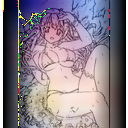

Train data : color image


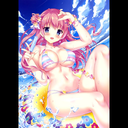

Train data : Generated image


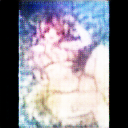

Train data : sketch image


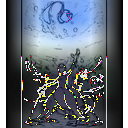

Train data : color image


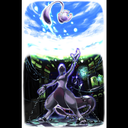

Train data : Generated image


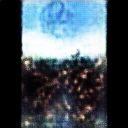

Validation data : sketch image


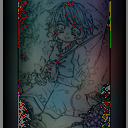

Validation data : color image


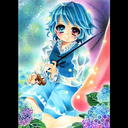

Validation data : Generated image


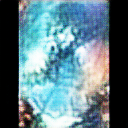

Validation data : sketch image


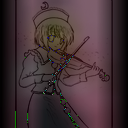

Validation data : color image


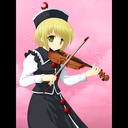

Validation data : Generated image


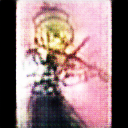

Saved model to disk
Epoch number: 1
Elapsed Time: 0:04:18.445688
Generator Loss Train: [27.715668, 24.472391]
Generator Loss Val: [29.903677, 26.441137]
Generator Accuracy Train: [0.08323317, 0.43559694]
Generator Accuracy Val: [0.1449319, 0.4760617]
Discriminator Loss: [0.897166329412124, 0.897166329412124]
Discriminator Accuracy: [0.29677483974358976, 0.29677483974358976]
Train data : sketch image


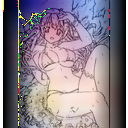

Train data : color image


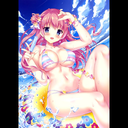

Train data : Generated image


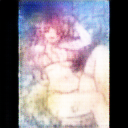

Train data : sketch image


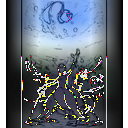

Train data : color image


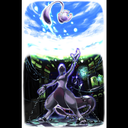

Train data : Generated image


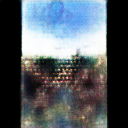

Validation data : sketch image


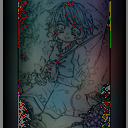

Validation data : color image


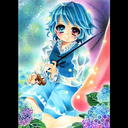

Validation data : Generated image


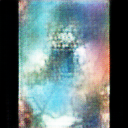

Validation data : sketch image


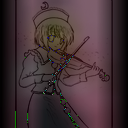

Validation data : color image


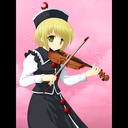

Validation data : Generated image


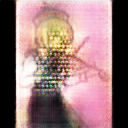

Saved model to disk
Epoch number: 20
Elapsed Time: 0:40:27.985742
Generator Loss Train: [27.715668, 24.472391, 23.334543, 22.294981, 21.647541, 20.903858, 20.382505, 19.86131, 19.405058, 18.939247, 18.556055, 18.17614, 17.858807, 17.57207, 17.298454, 17.044823, 16.807783, 16.585327, 16.375793, 16.175837, 15.993237]
Generator Loss Val: [29.903677, 26.441137, 24.955404, 23.754635, 23.097263, 22.374237, 21.9527, 21.55639, 21.272009, 20.974766, 20.782393, 20.569527, 20.431818, 20.297531, 20.18192, 20.068163, 19.97205, 19.879007, 19.799137, 19.714594, 19.649328]
Generator Accuracy Train: [0.08323317, 0.43559694, 0.30732507, 0.3640074, 0.29925883, 0.34481838, 0.3018687, 0.2929312, 0.26516873, 0.26001602, 0.2400204, 0.23076923, 0.21723218, 0.20475619, 0.19380341, 0.1833183, 0.17526278, 0.16568732, 0.15890688, 0.15648538, 0.15113229]
Generator Accuracy Val: [0.1449319, 0.4760617, 0.35089478, 0.38799578, 0.3270032, 0.3667034, 0.3261361, 0.30515075, 0.27938035, 0.26572517, 0.24854313, 0.23440003

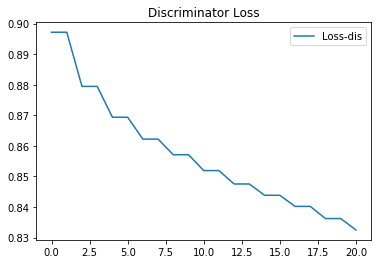

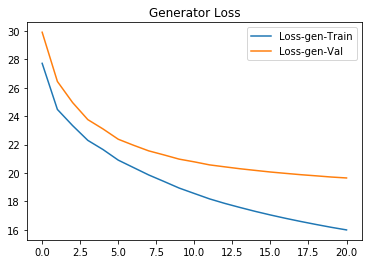

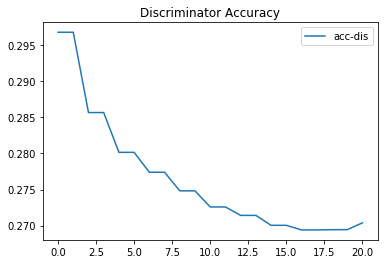

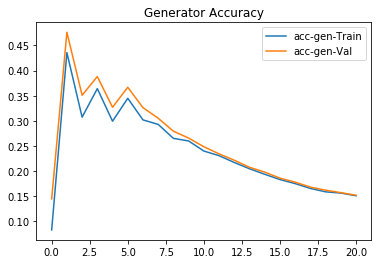

Train data : sketch image


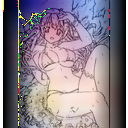

Train data : color image


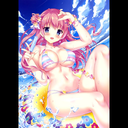

Train data : Generated image


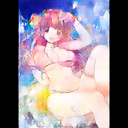

Train data : sketch image


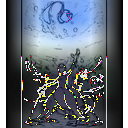

Train data : color image


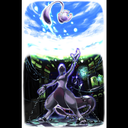

Train data : Generated image


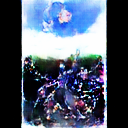

Validation data : sketch image


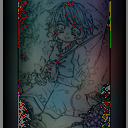

Validation data : color image


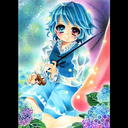

Validation data : Generated image


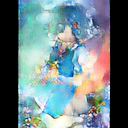

Validation data : sketch image


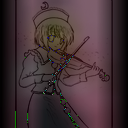

Validation data : color image


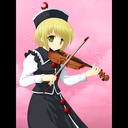

Validation data : Generated image


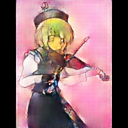

Saved model to disk
Epoch number: 40
Elapsed Time: 1:17:52.553507
Generator Loss Train: [27.715668, 24.472391, 23.334543, 22.294981, 21.647541, 20.903858, 20.382505, 19.86131, 19.405058, 18.939247, 18.556055, 18.17614, 17.858807, 17.57207, 17.298454, 17.044823, 16.807783, 16.585327, 16.375793, 16.175837, 15.993237, 15.814843, 15.650365, 15.49475, 15.34447, 15.197096, 15.066724, 14.9288845, 14.808621, 14.688239, 14.582083, 14.4762745, 14.380287, 14.2737, 14.1842165, 14.090066, 14.008743, 13.92587, 13.8532, 13.774915, 13.709988]
Generator Loss Val: [29.903677, 26.441137, 24.955404, 23.754635, 23.097263, 22.374237, 21.9527, 21.55639, 21.272009, 20.974766, 20.782393, 20.569527, 20.431818, 20.297531, 20.18192, 20.068163, 19.97205, 19.879007, 19.799137, 19.714594, 19.649328, 19.57494, 19.514631, 19.455482, 19.404976, 19.346554, 19.304724, 19.249428, 19.211124, 19.166904, 19.135393, 19.094837, 19.06898, 19.024727, 19.00183, 18.965992, 18.947224, 18.914759, 18.899282, 18.866724, 18.855997]
Gen

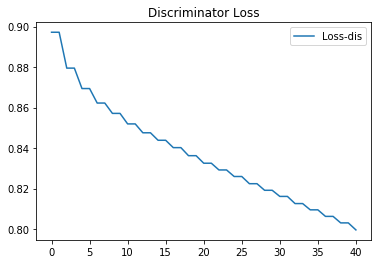

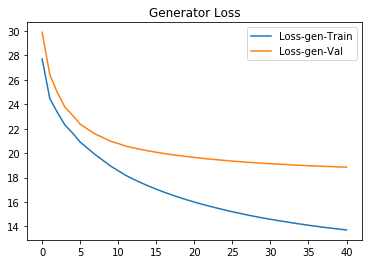

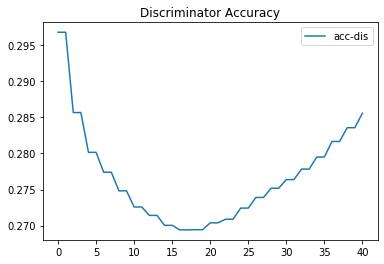

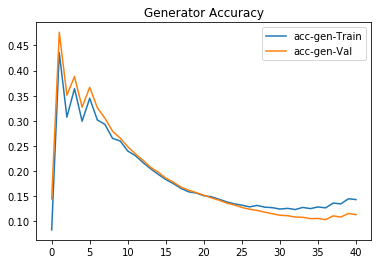

Train data : sketch image


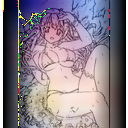

Train data : color image


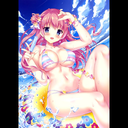

Train data : Generated image


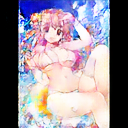

Train data : sketch image


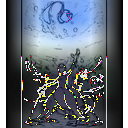

Train data : color image


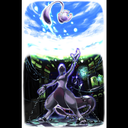

Train data : Generated image


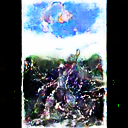

Validation data : sketch image


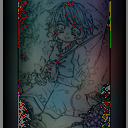

Validation data : color image


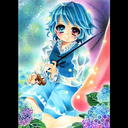

Validation data : Generated image


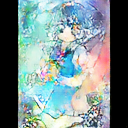

Validation data : sketch image


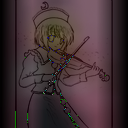

Validation data : color image


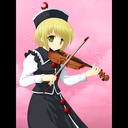

Validation data : Generated image


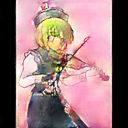

Saved model to disk
Epoch number: 60
Elapsed Time: 1:55:10.814089
Generator Loss Train: [27.715668, 24.472391, 23.334543, 22.294981, 21.647541, 20.903858, 20.382505, 19.86131, 19.405058, 18.939247, 18.556055, 18.17614, 17.858807, 17.57207, 17.298454, 17.044823, 16.807783, 16.585327, 16.375793, 16.175837, 15.993237, 15.814843, 15.650365, 15.49475, 15.34447, 15.197096, 15.066724, 14.9288845, 14.808621, 14.688239, 14.582083, 14.4762745, 14.380287, 14.2737, 14.1842165, 14.090066, 14.008743, 13.92587, 13.8532, 13.774915, 13.709988, 13.633809, 13.574675, 13.505047, 13.44878, 13.381887, 13.329538, 13.265965, 13.2201605, 13.160569, 13.118941, 13.060047, 13.020541, 12.966915, 12.931493, 12.880039, 12.848323, 12.802128, 12.77421, 12.729364, 12.704403]
Generator Loss Val: [29.903677, 26.441137, 24.955404, 23.754635, 23.097263, 22.374237, 21.9527, 21.55639, 21.272009, 20.974766, 20.782393, 20.569527, 20.431818, 20.297531, 20.18192, 20.068163, 19.97205, 19.879007, 19.799137, 19.714594, 19.649328, 1

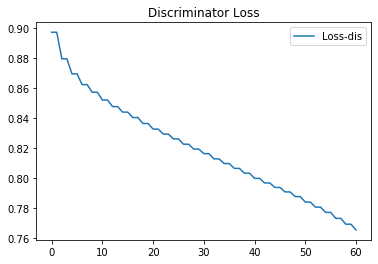

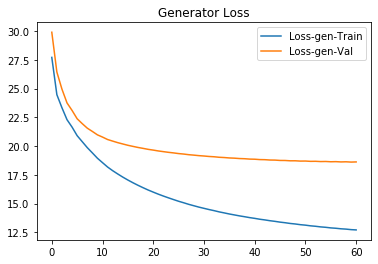

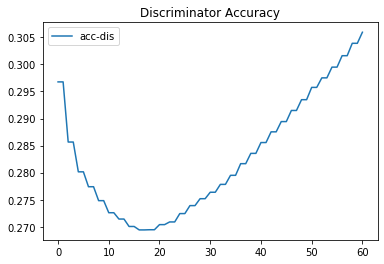

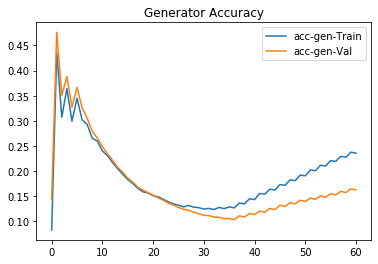

Train data : sketch image


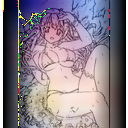

Train data : color image


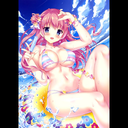

Train data : Generated image


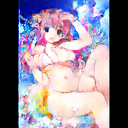

Train data : sketch image


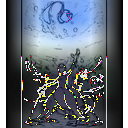

Train data : color image


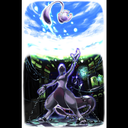

Train data : Generated image


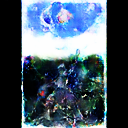

Validation data : sketch image


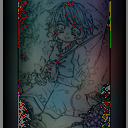

Validation data : color image


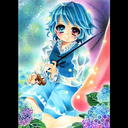

Validation data : Generated image


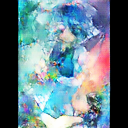

Validation data : sketch image


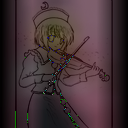

Validation data : color image


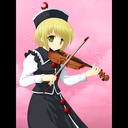

Validation data : Generated image


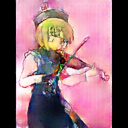

Saved model to disk
Epoch number: 80
Elapsed Time: 2:32:25.939243
Generator Loss Train: [27.715668, 24.472391, 23.334543, 22.294981, 21.647541, 20.903858, 20.382505, 19.86131, 19.405058, 18.939247, 18.556055, 18.17614, 17.858807, 17.57207, 17.298454, 17.044823, 16.807783, 16.585327, 16.375793, 16.175837, 15.993237, 15.814843, 15.650365, 15.49475, 15.34447, 15.197096, 15.066724, 14.9288845, 14.808621, 14.688239, 14.582083, 14.4762745, 14.380287, 14.2737, 14.1842165, 14.090066, 14.008743, 13.92587, 13.8532, 13.774915, 13.709988, 13.633809, 13.574675, 13.505047, 13.44878, 13.381887, 13.329538, 13.265965, 13.2201605, 13.160569, 13.118941, 13.060047, 13.020541, 12.966915, 12.931493, 12.880039, 12.848323, 12.802128, 12.77421, 12.729364, 12.704403, 12.663635, 12.640976, 12.5981655, 12.576254, 12.538046, 12.518909, 12.48252, 12.466276, 12.4319515, 12.417393, 12.383149, 12.369358, 12.335754, 12.322791, 12.292721, 12.282034, 12.254613, 12.246129, 12.220258, 12.213268]
Generator Loss Val: [29.903

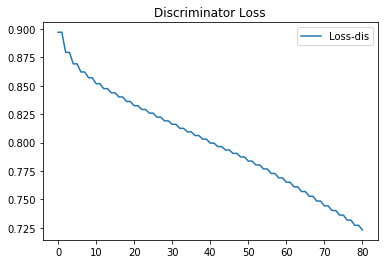

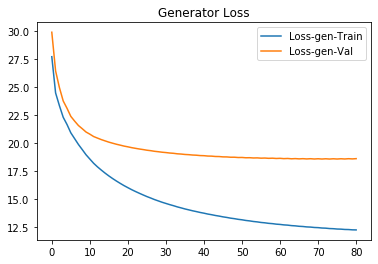

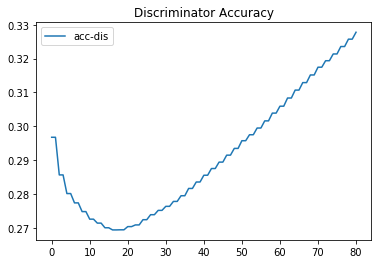

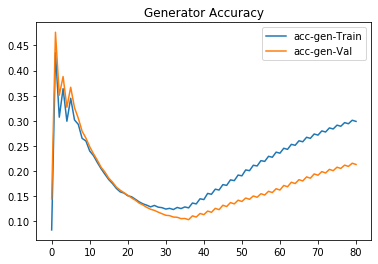

Train data : sketch image


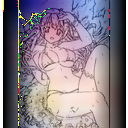

Train data : color image


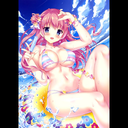

Train data : Generated image


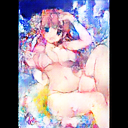

Train data : sketch image


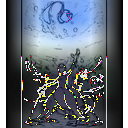

Train data : color image


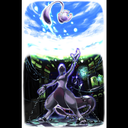

Train data : Generated image


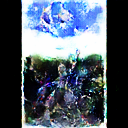

Validation data : sketch image


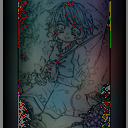

Validation data : color image


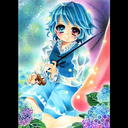

Validation data : Generated image


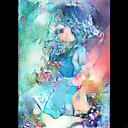

Validation data : sketch image


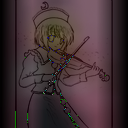

Validation data : color image


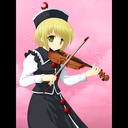

Validation data : Generated image


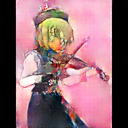

Saved model to disk
Epoch number: 99
Elapsed Time: 3:07:58.544053
Generator Loss Train: [27.715668, 24.472391, 23.334543, 22.294981, 21.647541, 20.903858, 20.382505, 19.86131, 19.405058, 18.939247, 18.556055, 18.17614, 17.858807, 17.57207, 17.298454, 17.044823, 16.807783, 16.585327, 16.375793, 16.175837, 15.993237, 15.814843, 15.650365, 15.49475, 15.34447, 15.197096, 15.066724, 14.9288845, 14.808621, 14.688239, 14.582083, 14.4762745, 14.380287, 14.2737, 14.1842165, 14.090066, 14.008743, 13.92587, 13.8532, 13.774915, 13.709988, 13.633809, 13.574675, 13.505047, 13.44878, 13.381887, 13.329538, 13.265965, 13.2201605, 13.160569, 13.118941, 13.060047, 13.020541, 12.966915, 12.931493, 12.880039, 12.848323, 12.802128, 12.77421, 12.729364, 12.704403, 12.663635, 12.640976, 12.5981655, 12.576254, 12.538046, 12.518909, 12.48252, 12.466276, 12.4319515, 12.417393, 12.383149, 12.369358, 12.335754, 12.322791, 12.292721, 12.282034, 12.254613, 12.246129, 12.220258, 12.213268, 12.187935, 12.181472, 12.15

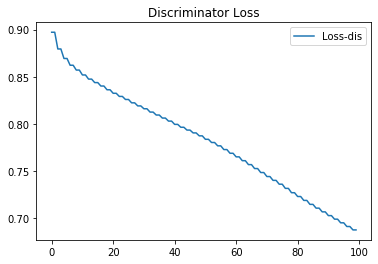

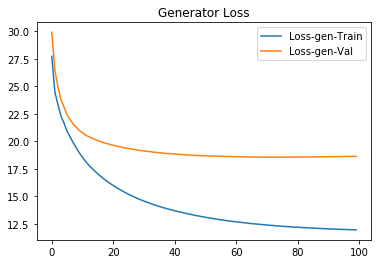

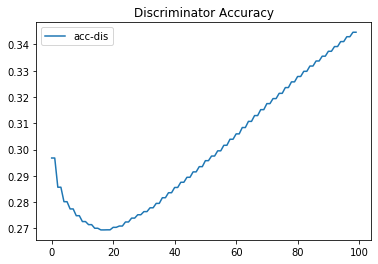

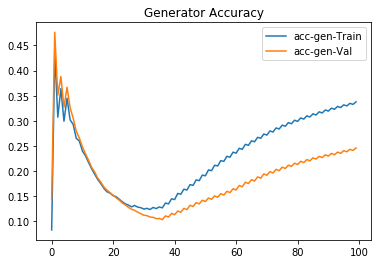

Train data : sketch image


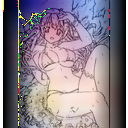

Train data : color image


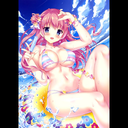

Train data : Generated image


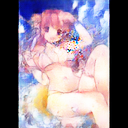

Train data : sketch image


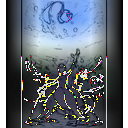

Train data : color image


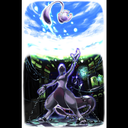

Train data : Generated image


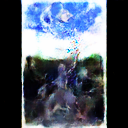

Validation data : sketch image


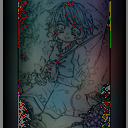

Validation data : color image


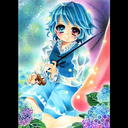

Validation data : Generated image


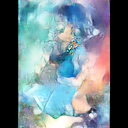

Validation data : sketch image


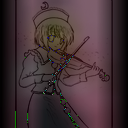

Validation data : color image


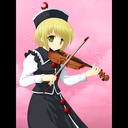

Validation data : Generated image


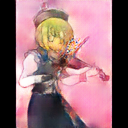

Saved model to disk


In [24]:
#Trained model for 100 epochs.
training(100,32)

In [0]:
#Load weights with best results.
generator= build_generator()
generator.load_weights('model_gen_hnt99.h5')

In [0]:
#Show generated images from the trained model.

n_samples = 10 #Number of sample want to be printed.

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Generate batch of skecth and corresponding color images from train data.
X_tr, Y_tr, res_tr = generate_train_batch(img_tr, n_samples, generator)

#Generate batch of skecth and corresponding color images from validation data.
X_val, Y_val, res_val = generate_val_batch(img_val, n_samples, generator)

#Generate batch of skecth and corresponding color images from test data.
X_ts, Y_ts, res_ts = generate_val_batch(img_tst, n_samples, generator)

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Function to generate 10 generated image from each train, validation and test data.
def print_results():
  #gen_arr = model.predict(X_tr)
  #Generate image on 10 samples from train, test and validation data.
  for i in range(10):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from validation data.
  for i in range(10):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from test data.
  for i in range(10):
    print('Test data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Test data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Test data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

Train data : sketch image


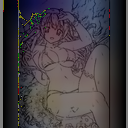

Train data : color image


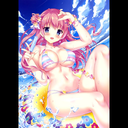

Train data : Generated image


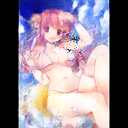

Train data : sketch image


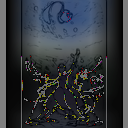

Train data : color image


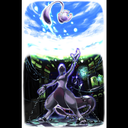

Train data : Generated image


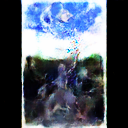

Train data : sketch image


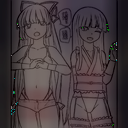

Train data : color image


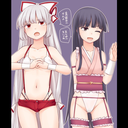

Train data : Generated image


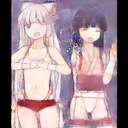

Train data : sketch image


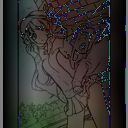

Train data : color image


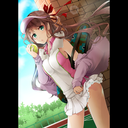

Train data : Generated image


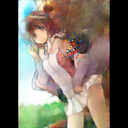

Train data : sketch image


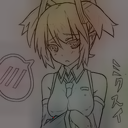

Train data : color image


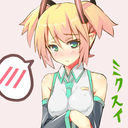

Train data : Generated image


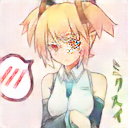

Train data : sketch image


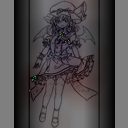

Train data : color image


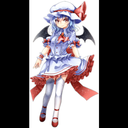

Train data : Generated image


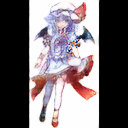

Train data : sketch image


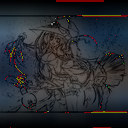

Train data : color image


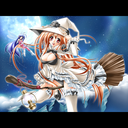

Train data : Generated image


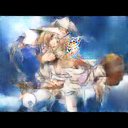

Train data : sketch image


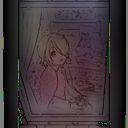

Train data : color image


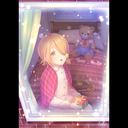

Train data : Generated image


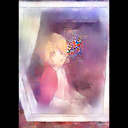

Train data : sketch image


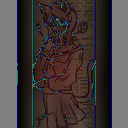

Train data : color image


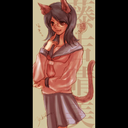

Train data : Generated image


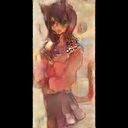

Train data : sketch image


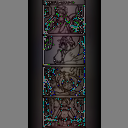

Train data : color image


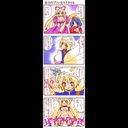

Train data : Generated image


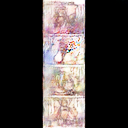

Validation data : sketch image


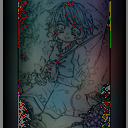

Validation data : color image


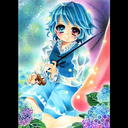

Validation data : Generated image


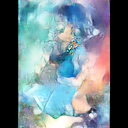

Validation data : sketch image


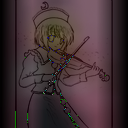

Validation data : color image


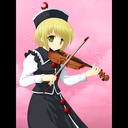

Validation data : Generated image


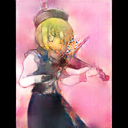

Validation data : sketch image


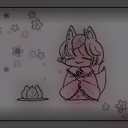

Validation data : color image


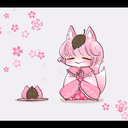

Validation data : Generated image


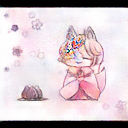

Validation data : sketch image


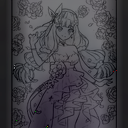

Validation data : color image


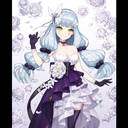

Validation data : Generated image


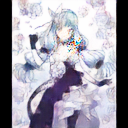

Validation data : sketch image


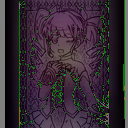

Validation data : color image


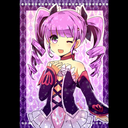

Validation data : Generated image


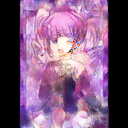

Validation data : sketch image


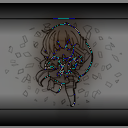

Validation data : color image


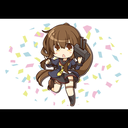

Validation data : Generated image


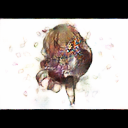

Validation data : sketch image


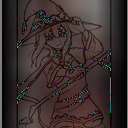

Validation data : color image


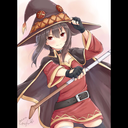

Validation data : Generated image


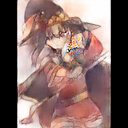

Validation data : sketch image


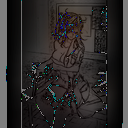

Validation data : color image


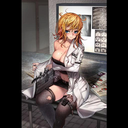

Validation data : Generated image


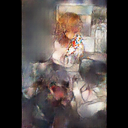

Validation data : sketch image


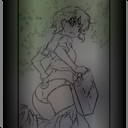

Validation data : color image


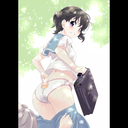

Validation data : Generated image


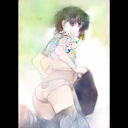

Validation data : sketch image


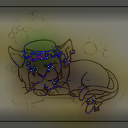

Validation data : color image


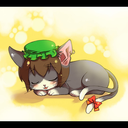

Validation data : Generated image


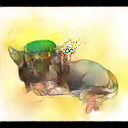

Test data : sketch image


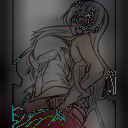

Test data : color image


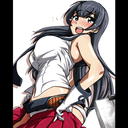

Test data : Generated image


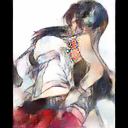

Test data : sketch image


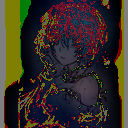

Test data : color image


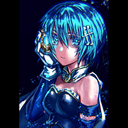

Test data : Generated image


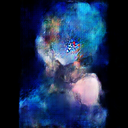

Test data : sketch image


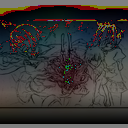

Test data : color image


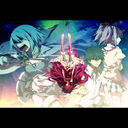

Test data : Generated image


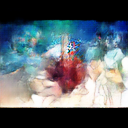

Test data : sketch image


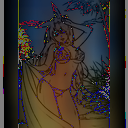

Test data : color image


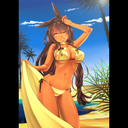

Test data : Generated image


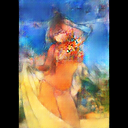

Test data : sketch image


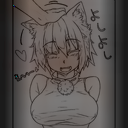

Test data : color image


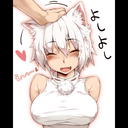

Test data : Generated image


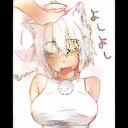

Test data : sketch image


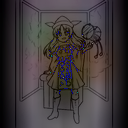

Test data : color image


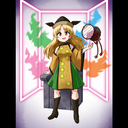

Test data : Generated image


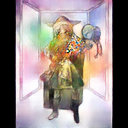

Test data : sketch image


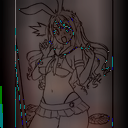

Test data : color image


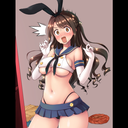

Test data : Generated image


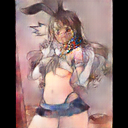

Test data : sketch image


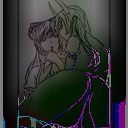

Test data : color image


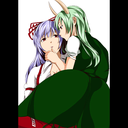

Test data : Generated image


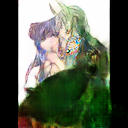

Test data : sketch image


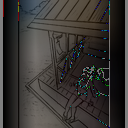

Test data : color image


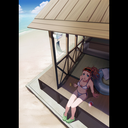

Test data : Generated image


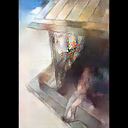

Test data : sketch image


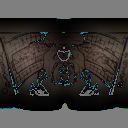

Test data : color image


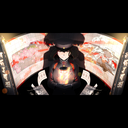

Test data : Generated image


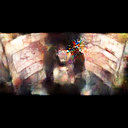

In [28]:
#Generate images on some train, validation and test images using GAN model trained above.
print_results()

**5. Passing Common hint image**

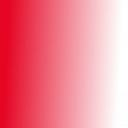

In [37]:
#We passed below common image as hint. 
img = cv2.imread('hint1.jpg',1)
cv2_imshow(img)

In [0]:
#Function to generate batch of images for model training.
#Changed logic to add hint image.

def generate_val_batch(arr, n_samples, generator):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global val_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    #Location where sketch images are stored.
    loc = 'sketch-pair/danbooru-sketch-pair-128x/color/sketch/'
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_sketches.append(img)

    #Location where color images are stored.
    loc = 'sketch-pair/danbooru-sketch-pair-128x/color/src/' 
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_color.append(img)
  
  #Update pointer  
  val_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  hint = cv2.imread('hint1.jpg',1)
  hint = cv2.cvtColor(hint, cv2.COLOR_BGR2RGB)

  for i in range(n_samples):
    X_sketches[i] = 0.5 *(X_sketches[i] + cv2.blur(hint,(32,32)))

  #Normalize data in range of -1 to +1
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5


  #Generate color images.
  X_res = generator.predict(X_sketches)

  #return batch of sketches, color images, and generated images.
  return X_sketches, X_color, X_res

In [0]:
#Show generated images from the trained model.

n_samples = 10 #Number of sample want to be printed.

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Generate batch of skecth and corresponding color images from train data.
X_tr, Y_tr, res_tr = generate_train_batch(img_tr, n_samples, generator)

#Generate batch of skecth and corresponding color images from validation data.
X_val, Y_val, res_val = generate_val_batch(img_val, n_samples, generator)

#Generate batch of skecth and corresponding color images from test data.
X_ts, Y_ts, res_ts = generate_val_batch(img_tst, n_samples, generator)

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Function to generate 10 generated image from each train, validation and test data.
def print_results():
  #gen_arr = model.predict(X_tr)
  #Generate image on 10 samples from train, test and validation data.
  for i in range(10):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from validation data.
  for i in range(10):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from test data.
  for i in range(10):
    print('Test data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Test data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Test data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

Train data : sketch image


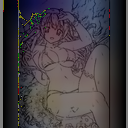

Train data : color image


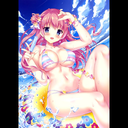

Train data : Generated image


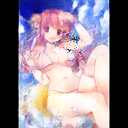

Train data : sketch image


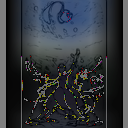

Train data : color image


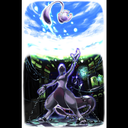

Train data : Generated image


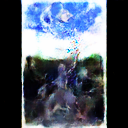

Train data : sketch image


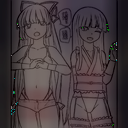

Train data : color image


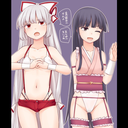

Train data : Generated image


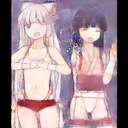

Train data : sketch image


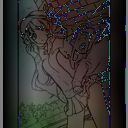

Train data : color image


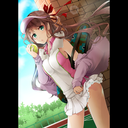

Train data : Generated image


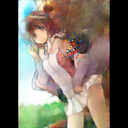

Train data : sketch image


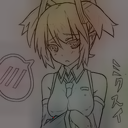

Train data : color image


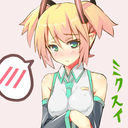

Train data : Generated image


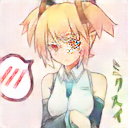

Train data : sketch image


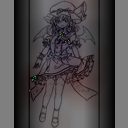

Train data : color image


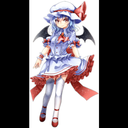

Train data : Generated image


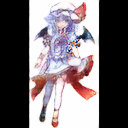

Train data : sketch image


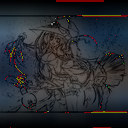

Train data : color image


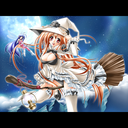

Train data : Generated image


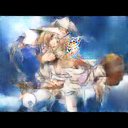

Train data : sketch image


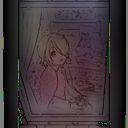

Train data : color image


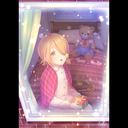

Train data : Generated image


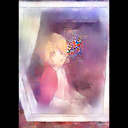

Train data : sketch image


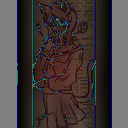

Train data : color image


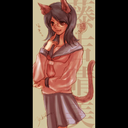

Train data : Generated image


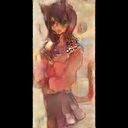

Train data : sketch image


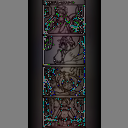

Train data : color image


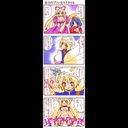

Train data : Generated image


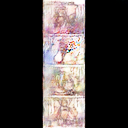

Validation data : sketch image


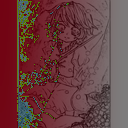

Validation data : color image


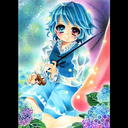

Validation data : Generated image


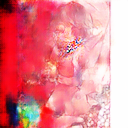

Validation data : sketch image


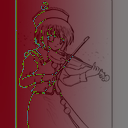

Validation data : color image


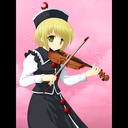

Validation data : Generated image


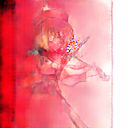

Validation data : sketch image


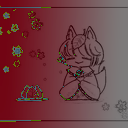

Validation data : color image


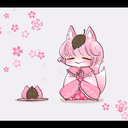

Validation data : Generated image


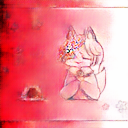

Validation data : sketch image


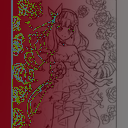

Validation data : color image


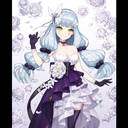

Validation data : Generated image


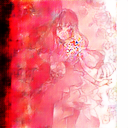

Validation data : sketch image


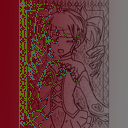

Validation data : color image


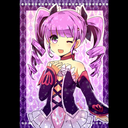

Validation data : Generated image


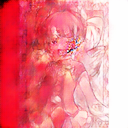

Validation data : sketch image


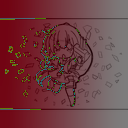

Validation data : color image


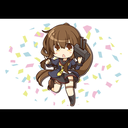

Validation data : Generated image


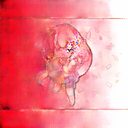

Validation data : sketch image


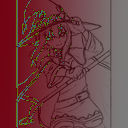

Validation data : color image


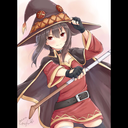

Validation data : Generated image


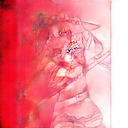

Validation data : sketch image


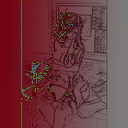

Validation data : color image


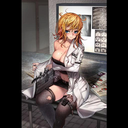

Validation data : Generated image


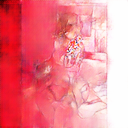

Validation data : sketch image


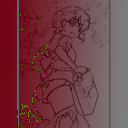

Validation data : color image


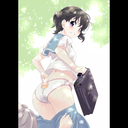

Validation data : Generated image


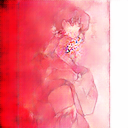

Validation data : sketch image


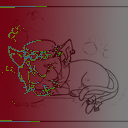

Validation data : color image


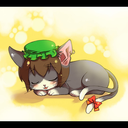

Validation data : Generated image


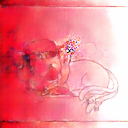

Test data : sketch image


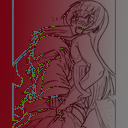

Test data : color image


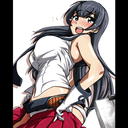

Test data : Generated image


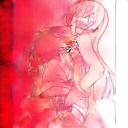

Test data : sketch image


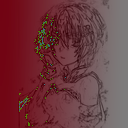

Test data : color image


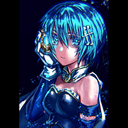

Test data : Generated image


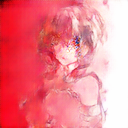

Test data : sketch image


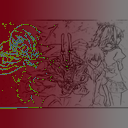

Test data : color image


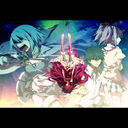

Test data : Generated image


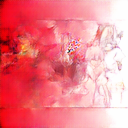

Test data : sketch image


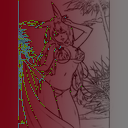

Test data : color image


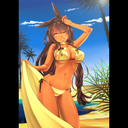

Test data : Generated image


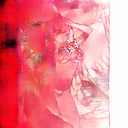

Test data : sketch image


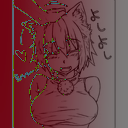

Test data : color image


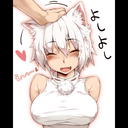

Test data : Generated image


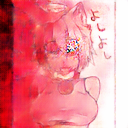

Test data : sketch image


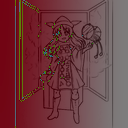

Test data : color image


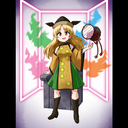

Test data : Generated image


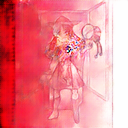

Test data : sketch image


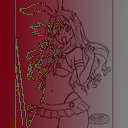

Test data : color image


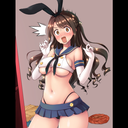

Test data : Generated image


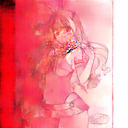

Test data : sketch image


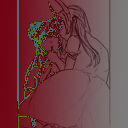

Test data : color image


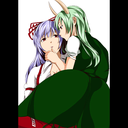

Test data : Generated image


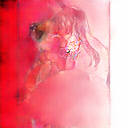

Test data : sketch image


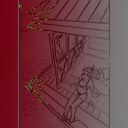

Test data : color image


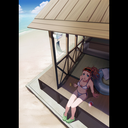

Test data : Generated image


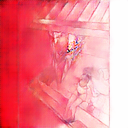

Test data : sketch image


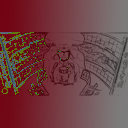

Test data : color image


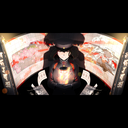

Test data : Generated image


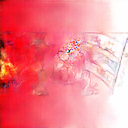

In [40]:
#Generate images on some train, validation and test images using GAN model trained above.
print_results()

**6. Model Comparision**

In [0]:
#Models with better results.
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Model Name", "Number of Epochs", "Epochs with best results", "Train Loss", "Test Loss"]
x.add_row(["GAN for Sketch Image", 160, 60, 12.62, 37.36])
x.add_row(["GAN for Sketch Image with Color Hint", 99, 99, 12.02, 18.74])
print(x)

+--------------------------------------+------------------+--------------------------+------------+-----------+
|              Model Name              | Number of Epochs | Epochs with best results | Train Loss | Test Loss |
+--------------------------------------+------------------+--------------------------+------------+-----------+
|         GAN for Sketch Image         |       160        |            60            |   12.62    |   37.36   |
| GAN for Sketch Image with Color Hint |        99        |            99            |   12.02    |   18.74   |
+--------------------------------------+------------------+--------------------------+------------+-----------+


**7. Steps Followed**

- Downloaded data from Danbooru Sketch Pair 128x on kaggle https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128xsv"
- Unzipped the folder.
- Imported all the required libraries. We have uses - Keras libraries, numpy, os, random, cv2, matplotlib.pyplot
- Loaded test data and generated image using model on train and test data.
- Also, generated Scalar graphs using Tensorboard. 
- Then defined a GAN model. Defined below functions -
    - Generator
    - Discriminator
    - Pixel Level loss.
    - GAN
    - Generate Sample for batch processing
    - Plot history
    - Summarize performance.
    - Training
    - Write Log
- Trained the GAN model and plotted results.
- Saved model weights.
- Generated images on train and test data using model generated above.
- Also, generated Scalar graphs using Tensorboard. 




**8. References**


*   https://machinelearningmastery.com/a-gentle-introduction-to-pix2pix-generative-adversarial-network/

*   https://machinelearningmastery.com/upsampling-and-transpose-convolution-layers-for-generative-adversarial-networks/

*   https://arxiv.org/pdf/1611.07004v1.pdf
*   https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/


*   https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128x
*   https://github.com/kvfrans/deepcolor/blob/master/main.py
- https://towardsdatascience.com/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb
- https://arxiv.org/pdf/1808.03240.pdf
- http://kvfrans.com/coloring-and-shading-line-art-automatically-through-conditional-gans/
- https://arxiv.org/pdf/1705.01908v2.pdf





